In [1]:
import torch
from torch.utils.data import DataLoader

import sys, os
module_rootdir = '../../..'
dataset_rootdir = '../../../../'
label_rootdir = module_rootdir
sys.path.append(module_rootdir)

import config_dataset
from modules.dataset_utils.bdd_dataset_utils.constants import _IMG_RESIZED_H_, _IMG_RESIZED_W_, _IMG_D_
from modules.dataset_utils.bdd_dataset_utils.remapped_bdd_utils import load_ground_truths
from modules.dataset_utils.bdd_dataset_and_dataloader import BerkeleyDeepDriveDataset, inverse_norm
from modules.dataset_utils.bdd_dataset_utils.constants import _IDX_TO_WEATHER_CLASS_, _IDX_TO_OBJ_CLASS_
from modules.plot.viz_annotation import vizualize_bbox_resized, vizualize_bbox_resized2

In [2]:
def infinite_loader(loader):
    """Get an infinite stream of batches from a data loader."""
    while True:
        yield from loader

In [3]:
BATCH_SIZE = 4
DEVICE = 'cuda'

img_h = _IMG_RESIZED_H_
img_w = _IMG_RESIZED_W_
img_d = _IMG_D_

# get the gt labels
sel_train_labels_file = config_dataset.bdd_sel_train_labels_file
train_images_dir = config_dataset.bdd_train_images_dir
gt_labels_train = load_ground_truths(
    label_rootdir,
    sel_train_labels_file, 
    dataset_rootdir,
    train_images_dir, 
    verbose=True)

# init data-loader
bdd_dataset = BerkeleyDeepDriveDataset(
    gt_labels_train, 
    (img_d, img_h, img_w),
    DEVICE, 16,
    augment = True,
    prob_augment = 1.0)

train_args = dict(batch_size=BATCH_SIZE, shuffle=False, collate_fn=bdd_dataset.collate_fn)
bdd_dataloader = DataLoader(bdd_dataset, **train_args)
bdd_dataloader = infinite_loader(bdd_dataloader)

Load JSON file .. please wait
annotations from 1/69863 aggregated
annotations from 2001/69863 aggregated
annotations from 4001/69863 aggregated
annotations from 6001/69863 aggregated
annotations from 8001/69863 aggregated
annotations from 10001/69863 aggregated
annotations from 12001/69863 aggregated
annotations from 14001/69863 aggregated
annotations from 16001/69863 aggregated
annotations from 18001/69863 aggregated
annotations from 20001/69863 aggregated
annotations from 22001/69863 aggregated
annotations from 24001/69863 aggregated
annotations from 26001/69863 aggregated
annotations from 28001/69863 aggregated
annotations from 30001/69863 aggregated
annotations from 32001/69863 aggregated
annotations from 34001/69863 aggregated
annotations from 36001/69863 aggregated
annotations from 38001/69863 aggregated
annotations from 40001/69863 aggregated
annotations from 42001/69863 aggregated
annotations from 44001/69863 aggregated
annotations from 46001/69863 aggregated
annotations from 4

BATCH: 0
--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[ 97.370766 112.349884 106.619545 118.62659 ]
 [109.08572  106.820244 121.56358  117.07948 ]
 [ 21.619984 118.72469   42.48038  125.464226]
 [440.0461    85.95331  456.26068   99.694695]
 [469.81085   84.01149  476.8999    92.51624 ]
 [474.45114   83.8964   488.99603   95.6142  ]
 [485.71146   79.407166 514.0373   102.78603 ]
 [496.54828   80.6934   522.7809   106.576324]
 [509.5286    73.06521  569.7446   116.66828 ]
 [582.4363    73.828735 622.1279   137.5636  ]
 [102.953804 319.18295  117.368645 332.37964 ]
 [151.2924   314.5865   161.20354  324.49908 ]
 [158.82199  312.41055  182.1219   330.5276  ]
 [165.15256  295.1138   188.17358  322.71457 ]
 [182.52151  310.95566  197.1076 

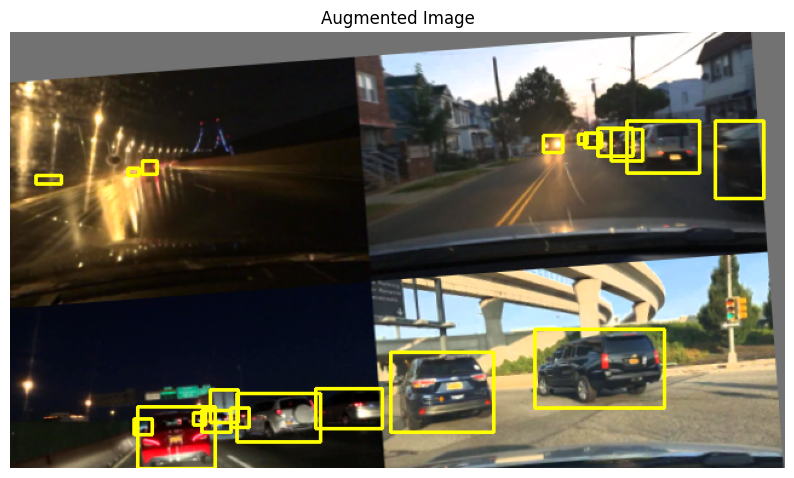

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[106.65627   71.57067  115.8554    77.421394]
 [119.20053   66.97369  131.4721    76.74175 ]
 [ 27.627493  73.24231   48.952724  78.67511 ]
 [519.6171    92.991684 549.1452   102.82887 ]
 [575.39233   92.74576  597.04614  101.51724 ]
 [408.06693   97.188896 423.15903  107.68187 ]
 [445.79715   96.53307  452.03088  102.10748 ]
 [345.73      93.670654 380.83554  117.51906 ]
 [307.71683   91.81122  343.80658  116.73207 ]
 [398.55234   96.861    409.70737  107.02606 ]
 [386.41306   97.5168   403.47366  107.353966]
 [374.60187   98.50051  393.631    109.64931 ]
 [428.53967   96.53307  435.10144  103

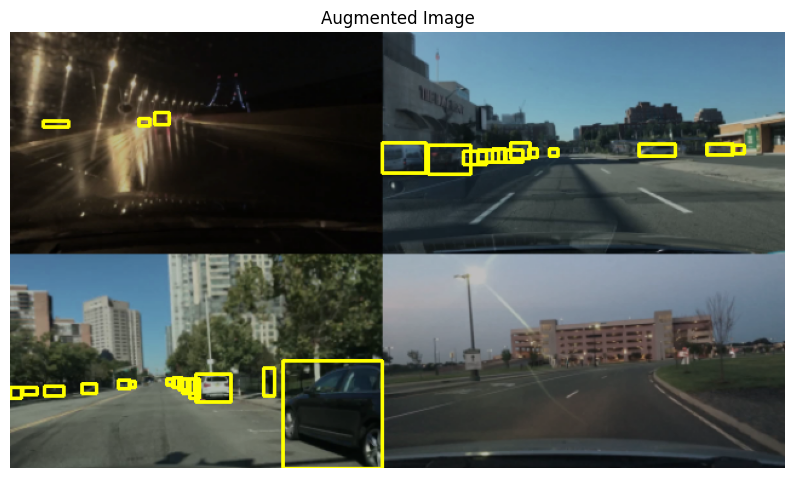

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'person', 'person', 'person', 'person', 'person', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[231.88774   60.76255  347.30637  123.95399 ]
 [337.2936    61.99765  347.06757   96.25311 ]
 [258.2989    68.25737  291.90707  143.8921  ]
 [138.2493    84.93011  143.32559  100.20702 ]
 [ 97.47645   83.646996 102.54175   97.68882 ]
 [118.05401   82.61787  125.644646 102.857216]
 [125.093285  86.9996   142.33664  127.90839 ]
 [ 93.77113   83.67271   99.71126  103.48567 ]
 [ 43.17343   84.12788   48.58056   90.3511  ]
 [ 39.887157  84.97698   45.717068  92.43899 ]
 [ 36.600883  85.80774   44.926743  96.173676]
 [ 51.40738   83.96991   66.287285  90.68933 ]
 [ 51.014053  86.02104   67.1401

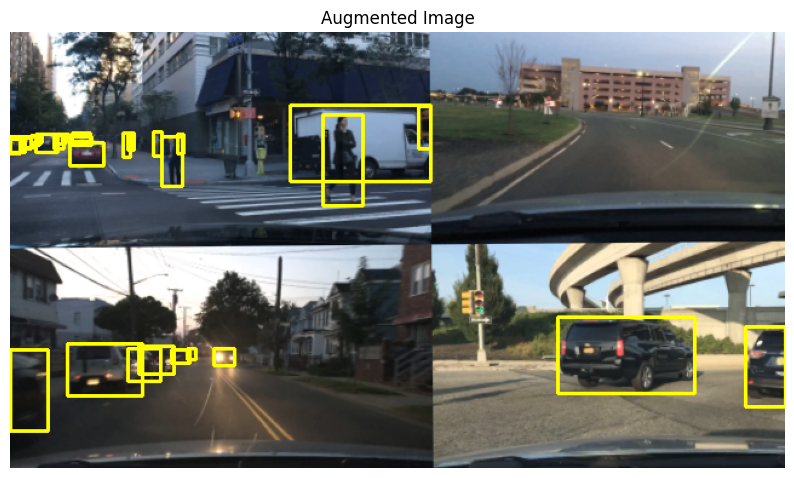

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[571.8232    42.241077 578.181     47.51864 ]
 [561.79047   42.838943 571.88696   51.133747]
 [622.4229    45.190853 631.0038    50.87075 ]
 [338.22003   33.22012  436.82397  106.13216 ]
 [ 89.488594  13.214096 246.19386  146.56757 ]
 [272.0952    39.7477   338.59146   95.15819 ]
 [238.72252   49.549637 249.69989   57.421795]
 [ 71.97734   48.520424 103.886566  63.953793]
 [  0.         0.        69.05213  156.94316 ]
 [335.9651   246.29045  344.28113  253.97775 ]
 [343.81113  244.4289   358.0979   256.47937 ]
 [355.88257  245.91962  374.49384  261.98065 ]
 [364.6946   247.69235  392.52655  265.85995 ]
 [416.51123  250.41603  490.0023   293.91693 ]
 [143.48535  274.6652   153.345

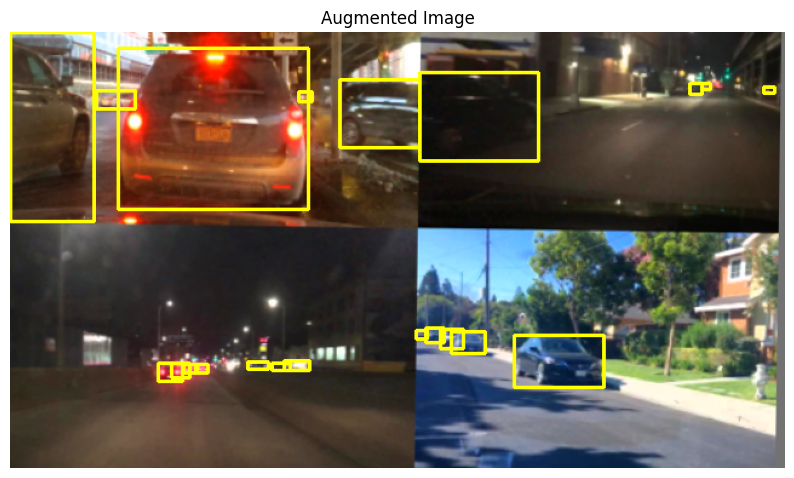

BATCH: 1
--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[ 45.858414  54.597225 174.53397  163.27113 ]
 [  0.        74.42412   23.396667 119.56341 ]
 [ 42.53656   82.95043   51.567917  89.34516 ]
 [163.70724   84.078896 190.0487    96.49221 ]
 [193.43546   27.27862  325.14276  173.98135 ]
 [338.18564   45.287098 425.31174  110.31442 ]
 [467.12964   36.146988 578.77844   97.72248 ]
 [239.99931  266.46808  325.3985   360.      ]
 [159.60728  282.0397   168.78699  299.00174 ]
 [154.04382  282.87393  164.33623  294.83075 ]
 [150.70573  282.3178   158.21642  292.0501  ]
 [145.69862  281.20554  153.48746  289.26944 ]
 [139.85698  282.0397   146.25497  287.60104 ]
 [164.89256  278.14682  195.76979  302.06046 ]
 [ 67.25379 

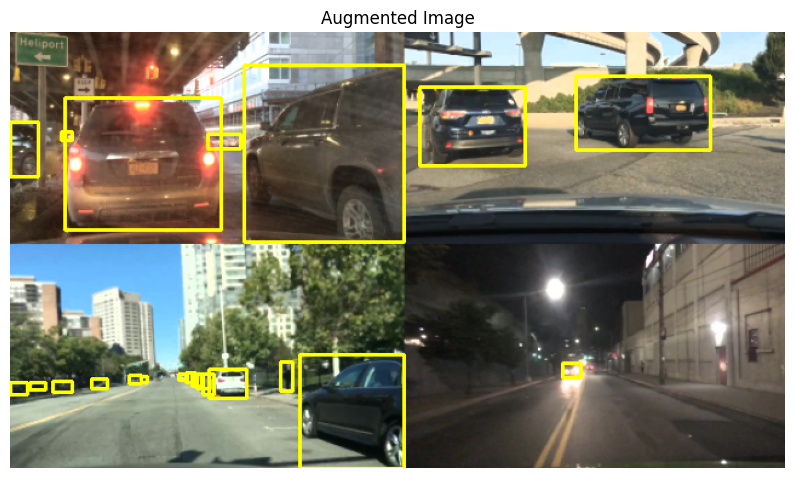

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[117.08678   83.01576  131.74638   98.67206 ]
 [ 17.134949  96.67338   39.124348 104.33497 ]
 [  0.        97.00649   16.13543  106.33365 ]
 [ 46.12097   71.35682  125.74926  142.64291 ]
 [632.7637    56.348423 640.        68.56993 ]
 [618.7573    57.621494 640.        71.37069 ]
 [543.12305   59.14918  599.6578    91.99448 ]
 [148.27661  257.3482   163.72546  270.0912  ]
 [178.40182  256.96204  184.96759  265.07123 ]
 [183.03648  257.73434  196.94043  268.54657 ]
 [194.62311  255.0313   221.65857  276.65576 ]
 [205.4373   256.96204  230.15544  281.28955 ]
 [218.87779  252.71439  276.8109   292.48795 ]
 [292.25977  257.27097  329.33694  319.05518 ]
 [481.93802  271.55014  489.67917  277.8566  ]
 [356.07236  276.

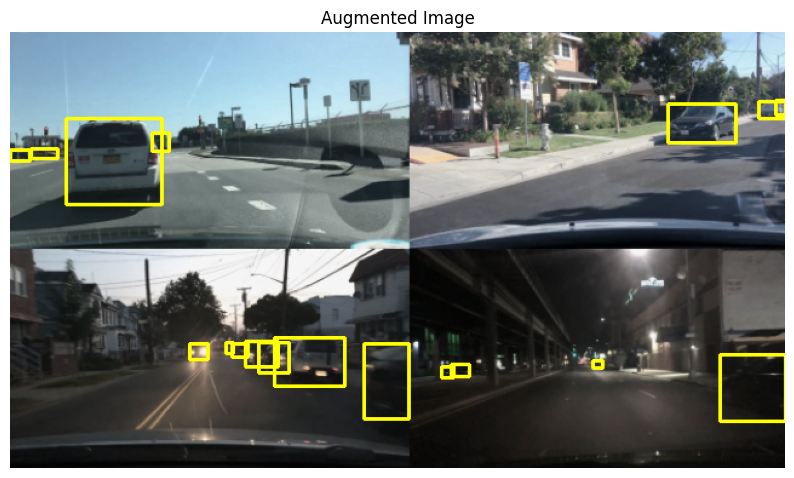

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[138.01794    72.15295   174.68365    86.531006 ]
 [205.87164    76.37322   232.88641    88.81478  ]
 [  2.1293664  68.22684    21.313839   82.234024 ]
 [ 48.411366   70.48539    56.436222   77.78215  ]
 [ 62.38595    71.81548    69.16196    78.23344  ]
 [ 72.056854   70.85555    78.43436    77.24695  ]
 [  0.         67.05629     5.0014987  80.344925 ]
 [ 27.316372   69.086876   35.872986   78.40776  ]
 [173.4797     74.59254   186.61523    81.44168  ]
 [131.58308    73.79836   144.75494    79.44988  ]
 [  9.55313    61.753994   29.349339   78.98384  ]
 [231.5588     79.21041   244.85435    88.845245 ]
 [184.9002     75.64248   193.60808    81.90951  ]
 [ 42.61788   288.66983   

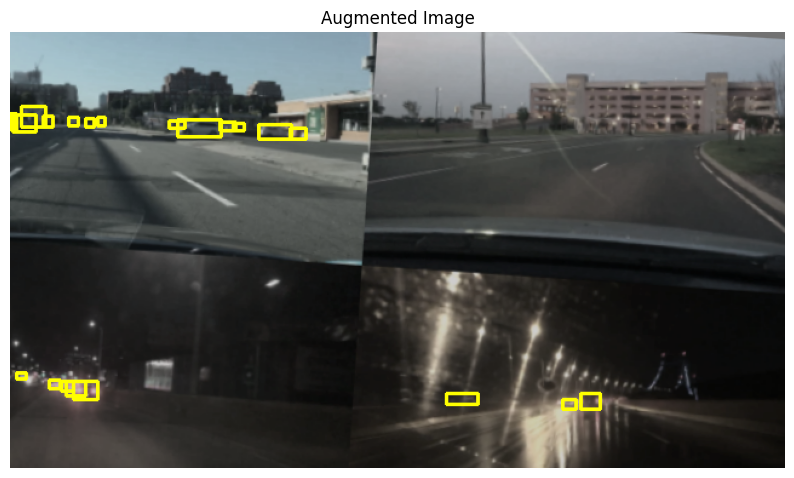

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'person', 'person', 'person']
bounding boxes
[[607.0607    61.561718 640.        95.05978 ]
 [447.56888   73.19797  573.8436   154.3492  ]
 [233.77922  148.00253  241.02603  160.71057 ]
 [310.50558  133.73409  317.21173  147.72188 ]
 [361.2079   124.221794 368.17856  140.90134 ]]


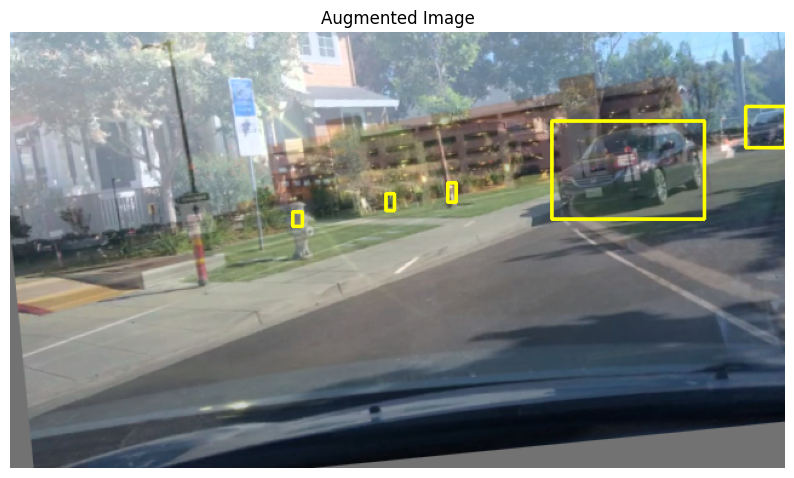

BATCH: 2
--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[557.0796     11.011523  576.0295     28.411005 ]
 [499.5466     14.825198  512.59076    27.878536 ]
 [472.92123    14.832941  503.4943     38.781803 ]
 [462.43716     0.        492.81708    30.10502  ]
 [453.18515    17.111973  472.39847    37.51154  ]
 [376.62448     6.626836  466.3347     60.43516  ]
 [309.9255     13.997514  381.72467    58.577908 ]
 [491.7477      3.8371897 575.7965     75.4354   ]
 [  0.        284.55566    15.526052  360.       ]
 [297.22556   281.9902    334.83774   307.70898  ]
 [ 92.36007   294.78952   105.16125   316.12933  ]
 [ 97.78724   295.20535   111.395325  310.6508   ]
 [105.070015  294.1858    115.10642   306.6663 

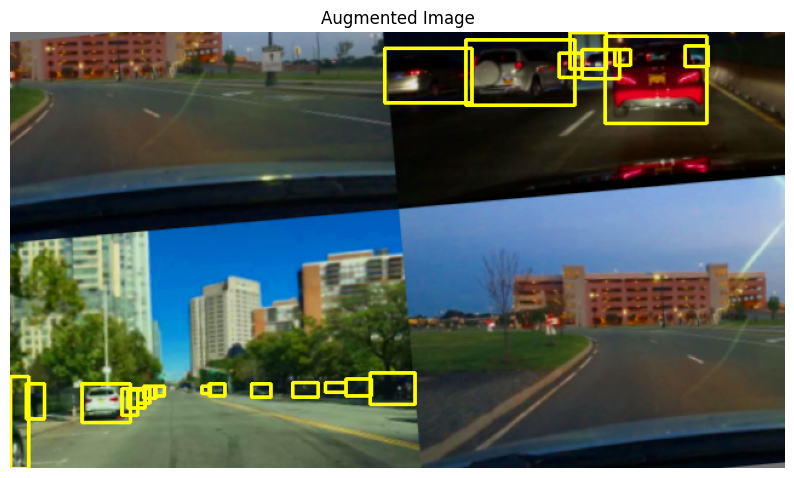

--------------------------------------------------
obj labels: 
['person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[ 89.0202   137.5434    97.122406 158.2727  ]
 [139.13924  131.60378  145.98148  150.06277 ]
 [147.29634  130.51498  152.71172  144.51677 ]
 [142.9654   131.2285   150.94247  150.31763 ]
 [135.43828  133.49414  142.74367  150.90138 ]
 [112.27314  132.21988  124.155365 159.76012 ]
 [ 90.8685   138.94273  117.40758  194.77843 ]
 [146.79147  130.85323  156.44562  157.67996 ]
 [208.96419  125.13561  215.43541  131.60829 ]
 [210.09906  125.55726  217.11688  132.07161 ]
 [214.51344  125.72871  222.24

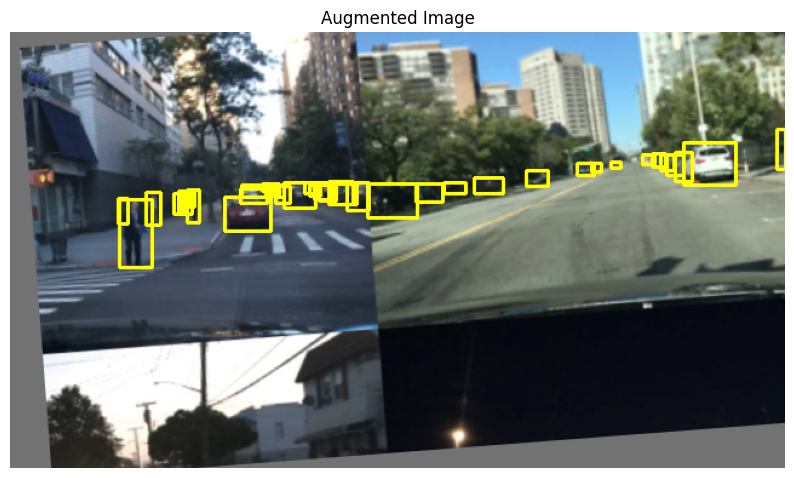

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle']
bounding boxes
[[455.4737     0.       605.14374   62.031834]
 [528.8847   264.15002  614.3174   309.03516 ]
 [498.70926  274.27158  533.0512   293.67725 ]
 [469.8211   269.44223  501.99106  288.81177 ]
 [448.873    269.09293  472.30658  285.41956 ]
 [378.0042   260.66656  408.71408  279.28745 ]
 [338.29205  260.72873  360.19324  271.95905 ]
 [320.93988  259.71506  335.58887  270.10034 ]
 [305.03574  256.5517   321.15686  268.41028 ]
 [297.8197   260.77884  305.15628  266.69608 ]
 [280.41934  257.5914   295.06833  267.97668 ]
 [145.79007  270.5797   160.873    307.0506  ]
 [  0.       314.79587   34.14558  329.72604 ]
 [ 35.703926 316.12604   71.28018  334.0615  ]]


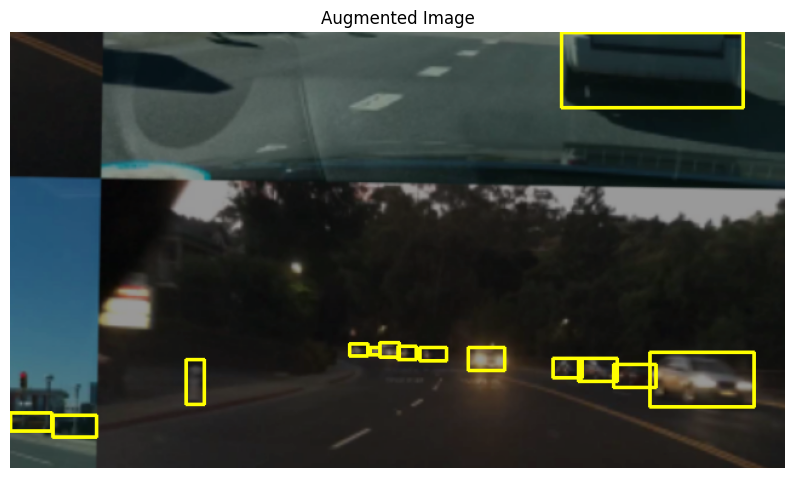

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[4.1950801e-01 1.5542770e+02 2.0524426e+02 2.6628268e+02]
 [4.1950801e-01 1.5763013e+02 1.7304703e+01 2.1856366e+02]
 [9.9528259e+01 1.6790807e+02 1.5825938e+02 3.0225549e+02]
 [3.6376584e+02 1.9528096e+02 3.7257550e+02 2.2244409e+02]
 [4.3130661e+02 1.9234441e+02 4.3864801e+02 2.1657098e+02]
 [4.4231870e+02 1.9161026e+02 4.4819180e+02 2.0996373e+02]
 [4.3644559e+02 1.9234441e+02 4.4525525e+02 2.1730513e+02]
 [4.2616763e+02 1.9454681e+02 4.3424316e+02 2.1730513e+02]
 [3.9533380e+02 1.9087611e+02 4.0854831e+02 2.2684892e+02]
 [3.6596826e+02 1.9895164e+02 3.9606796e+02 2.7163141e+02]
 [4.4158456e+02 1.9234441e+02 4.5186252e+0

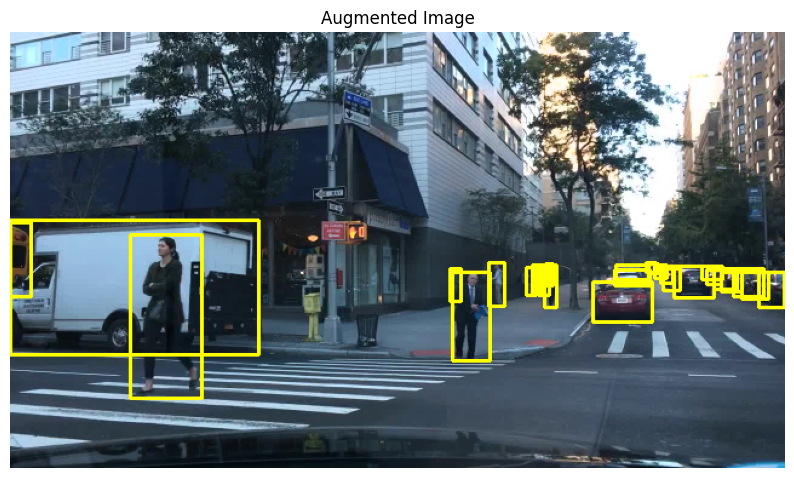

BATCH: 3
--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[  5.6773243  60.14677    17.36897    78.612946 ]
 [ 37.218517   61.43049    47.047535   73.32169  ]
 [ 43.401745   62.890926   63.69422    79.167076 ]
 [ 58.907333   60.053944   98.414215   92.54307  ]
 [ 73.62005    63.641872  110.11455    99.72617  ]
 [ 91.459526   58.79384   175.57845   119.221924 ]
 [191.69594    71.17612   248.5132    160.71672  ]
 [425.14175   115.46657   445.21802   133.84113  ]
 [493.85168   117.607     507.63693   131.42957  ]
 [503.99994   117.300964  536.5214    142.44743  ]
 [515.2962     94.14078   547.2155    132.73141  ]
 [537.671     118.79671   557.9386    140.43613  ]
 [544.7697    107.14691   591.14594   160.06432  ]
 [426.70032   107.53569   515.9223    182.95096  ]
 [ 47.678276  315.175

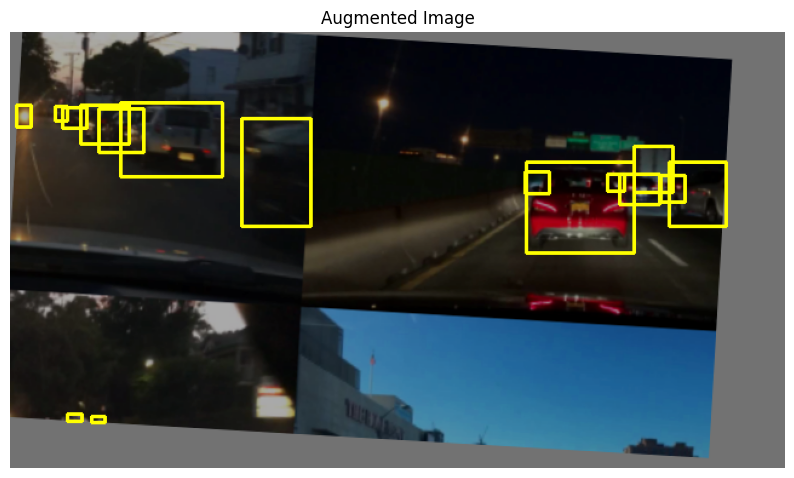

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person']
bounding boxes
[[ 26.516726  65.12145   73.0894    89.049034]
 [ 71.09912   70.97042   89.8078    81.339035]
 [ 88.215576  68.57766  105.730095  78.94628 ]
 [104.53591   68.57766  117.27375   77.351105]
 [139.56494   64.58973  156.28334   74.559555]
 [166.23477   64.98852  178.17647   70.97042 ]
 [179.7687    64.58973  187.72984   70.17283 ]
 [187.72984   62.994556 196.4871    69.375244]
 [202.0599    63.792137 210.02106   69.375244]
 [275.70047   72.16679  283.6616    92.10645 ]
 [366.71606   65.12145  413.28876  

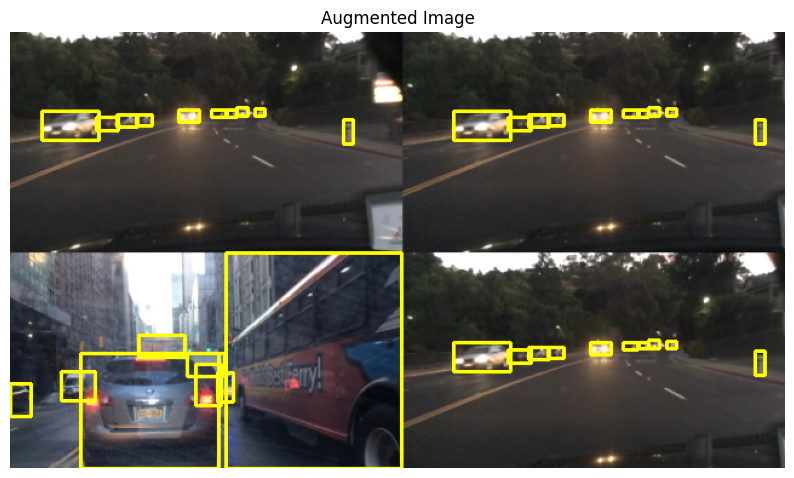

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[573.7211    88.75524  582.19214   95.30874 ]
 [565.5466    87.22382  578.68536   97.80852 ]
 [582.9554    89.6451   590.31506   95.728874]
 [556.5798    86.263725 573.5589    99.72944 ]
 [632.84973   92.931595 640.        98.843216]
 [616.66754   90.647095 630.79395   97.07514 ]
 [240.13019   56.586693 257.07492   74.48991 ]
 [335.92166   80.78967  359.6339    91.14409 ]
 [359.63333   83.609276 380.4041    95.378105]
 [241.63423   45.0734   332.19287  127.97534 ]
 [592.3

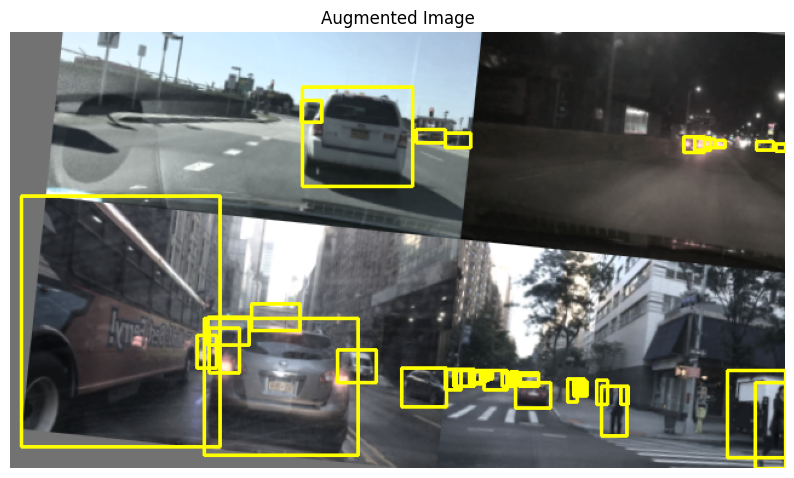

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[138.25853 143.9717  369.0703  338.981  ]
 [  0.      179.54994  97.96777 260.5499 ]
 [132.29996 194.84993 148.49995 206.32492]
 [349.64987 196.87492 396.89987 219.14992]
 [402.97485  94.94997 639.2248  358.19986]]


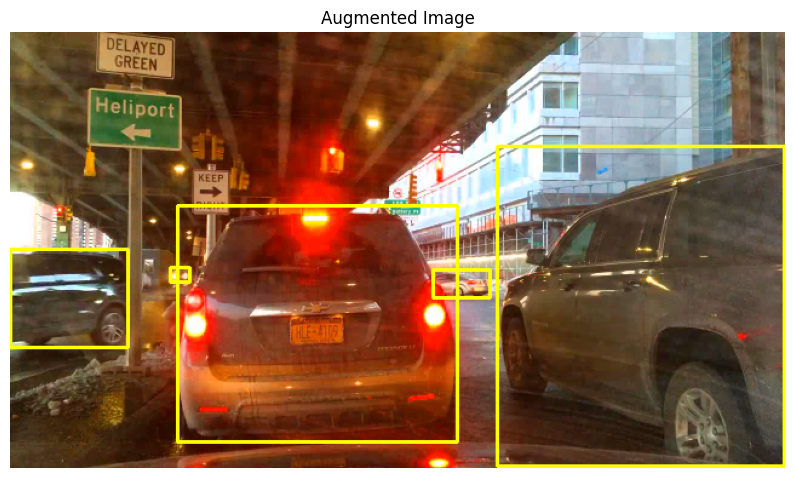

BATCH: 4
--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[545.08014 241.00935 563.9164  258.06738]
 [483.51788 239.16525 496.38165 252.074  ]
 [455.03387 238.2432  485.815   261.29462]
 [445.84546 214.73076 475.24835 251.15193]
 [433.90057 237.7822  452.73676 258.06738]
 [352.813   225.79546 444.69693 275.58646]
 [281.2556  225.79546 354.65063 267.28796]
 [475.69733 232.92694 559.7711  302.54214]
 [152.89474 193.87094 265.02563 277.88626]
 [  0.      182.0619   99.07532 261.61743]]


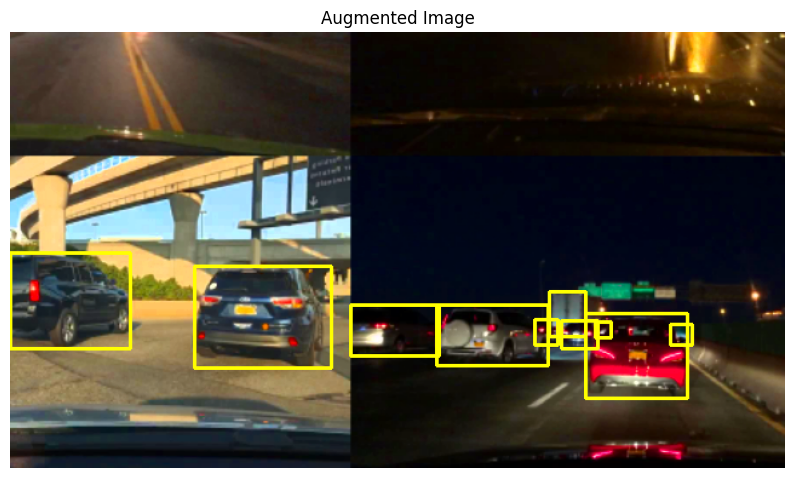

--------------------------------------------------
obj labels: 
['person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person']
bounding boxes
[[612.17145   66.64214  618.5155    80.386795]
 [273.55246   47.736195 292.2927    67.616066]
 [384.0244    71.12571  410.9347    81.976456]
 [411.39877   73.266495 434.84497   85.88684 ]
 [277.3982    34.21327  378.14825  125.70583 ]
 [619.5814   272.2973   626.55524  284.36765 ]
 [594.18756  271.14096  608.627    279.03198 ]
 [583.0497   269.96555  592.7941   277.09436 ]
 [572.84485  267.4481   583.58154  275.56998 ]
 [556.9825   267.37857  566.727    274.50742 ]
 [468.98822  271.7259   479.7964   295.66797 ]]


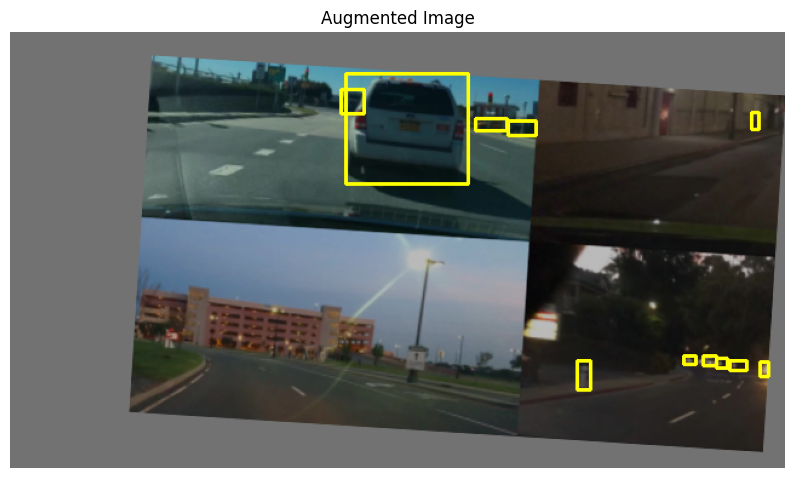

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'person', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[0.0000000e+00 0.0000000e+00 1.8326612e+01 1.6144037e+01]
 [1.4700331e+01 0.0000000e+00 5.5074471e+01 2.8449930e+01]
 [3.0721071e+01 0.0000000e+00 6.7678802e+01 3.5427349e+01]
 [5.0579811e+01 0.0000000e+00 1.3703209e+02 5.2542522e+01]
 [1.5933932e+02 2.8955421e-01 2.1502136e+02 9.2583267e+01]
 [4.2419879e+02 2.4253611e+01 4.3224710e+02 3.0838314e+01]
 [3.9775702e+02 2.2299910e+01 4.1743326e+02 3.8758789e+01]
 [4.8436343e+02 1.8707531e+01 4.9129163e+02 3.5380192e+01]
 [4.3881537e+02 2.8091226e+02 4.6189005e+02 3.0002347e+02]
 [4.8361853e+02 2.8062955e+02 4.9345145e+02 2.9275961e+02]
 [4.9047012e+02 2.8182367e+02 5.1123093e+02 2.9804688e+02]
 [5.0760468e+02 2.7791382e+02 5.4797876e+02 3.1035278e+02]
 [5.2362543e+02 2.8089151e+02 5.6058319e+02 3.1733020e+02]


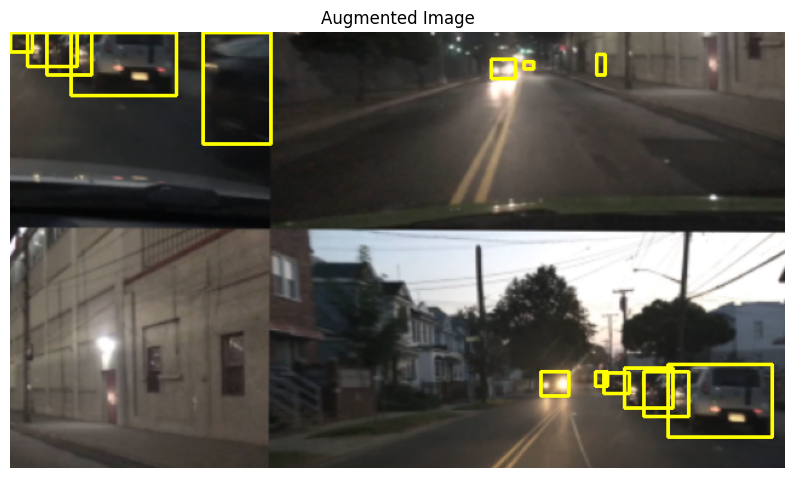

--------------------------------------------------
obj labels: 
['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']
bounding boxes
[[383.44495 170.9265  394.68576 177.53874]
 [354.35107 171.58772 368.898   182.16731]
 [339.80414 170.26527 362.28577 187.4571 ]
 [371.3225  171.47752 383.88577 181.39587]
 [323.71436 170.15508 352.80823 191.97546]
 [403.06128 166.84895 417.60822 173.4612 ]
 [414.96332 164.20406 426.20413 171.47752]
 [462.96545 168.08324 485.2735  176.67915]
 [433.03677 166.95915 458.1633  176.2163 ]
 [477.3388  164.97548 509.25116 176.2163 ]]


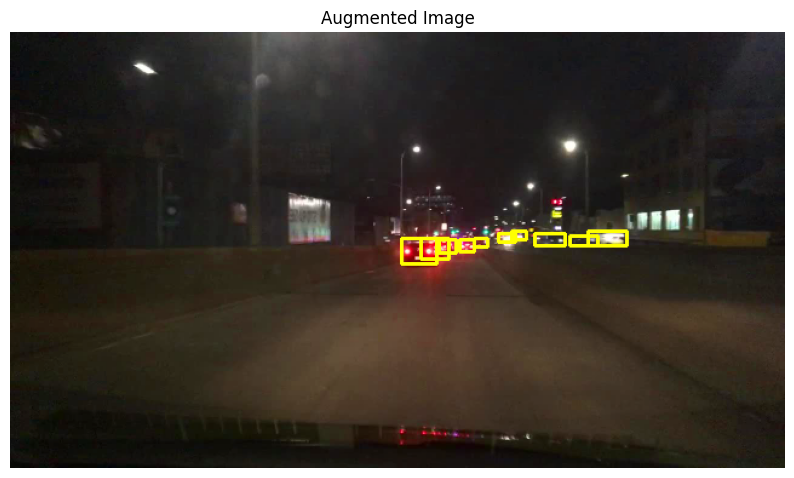

In [4]:
for iter in range(5):

    # if iter == 1:
    #     bdd_dataset.set_prob_augment(0.01)
    #     bdd_dataloader = DataLoader(bdd_dataset, **train_args)
    #     bdd_dataloader = infinite_loader(bdd_dataloader)
    
    # elif iter == 3:
    #     bdd_dataset.set_prob_augment(0.99)
    #     bdd_dataloader = DataLoader(bdd_dataset, **train_args)
    #     bdd_dataloader = infinite_loader(bdd_dataloader)

    images, labels = next(bdd_dataloader)       
    bbox_batch = labels['bbox_batch']             
    obj_class_label = labels['obj_class_label']  
    img_paths = labels['img_path']
    weather_class_labels = labels['weather_class_label']

    # for vizualization
    images_inv = inverse_norm(images)
    images_inv = (255.0 * images_inv.permute(0,2,3,1)).to(torch.uint8)
    
    print(f'BATCH: {iter}')
    print('=' * 100)      

    for sample_idx in range(len(obj_class_label)):
        image_np = images_inv[sample_idx].cpu().numpy()
        boxes = bbox_batch[sample_idx].cpu().numpy()
        cls = obj_class_label[sample_idx].cpu().numpy().tolist()
        img_path = img_paths[sample_idx]
        weather_label = weather_class_labels[sample_idx].cpu().numpy().tolist()

        print('-' * 50)
        print('obj labels: ')
        print([_IDX_TO_OBJ_CLASS_[id] for id in cls])
        # print('weather labels: ')
        # print(idx_to_weather_class[weather_label])
        print('bounding boxes')
        print(boxes)

        # vizualize_bbox_resized(img_path, boxes, config.IMG_RESIZED_W, config.IMG_RESIZED_H, figsize=(10,8))
        vizualize_bbox_resized2(img_path, image_np.copy(), boxes, figsize=(10,8))

        


        
    
